<a href="https://colab.research.google.com/github/kathy1124/YOLOv8_Segmentation/blob/main/PotholesSegmentation_YOLOv8_Complete_Upload.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Select the GPU**

#**Import the Required Libraries**

In [12]:
from IPython.display import Image

#**Clone the Github Repo**

In [2]:
!git clone https://github.com/MuhammadMoin97/ultralytics.git

fatal: destination path 'ultralytics' already exists and is not an empty directory.


#**Set the Current Directory**

In [3]:
%cd /content/ultralytics

/content/ultralytics


#**Install all the Dependencies**

In [4]:
!pip install -e .'[dev]'

Obtaining file:///content/ultralytics
  Preparing metadata (setup.py) ... done
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.0.3
    Uninstalling ultralytics-8.0.3:
      Successfully uninstalled ultralytics-8.0.3
  Running setup.py develop for ultralytics


#**Moving to the Segmentation Directory**

In [5]:
%cd /content/ultralytics/ultralytics/yolo/v8/segment

/content/ultralytics/ultralytics/yolo/v8/segment


In [6]:
!pwd

/content/ultralytics/ultralytics/yolo/v8/segment


#**Import the Dataset From Roboflow  into the GoogleColab**

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="3V0dDFy4Srmx0xfN0b0R")
project = rf.workspace("classification-btt2b").project("potholes_segmentation-jvwij")
version = project.version(1)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Potholes_Segmentation-1 in yolov5pytorch:: 100%|██████████| 372/372 [00:00<00:00, 4008.76it/s]


#**Training the Model**

In [1]:
HOME = "/content/ultralytics/ultralytics/yolo/v8/segment"

In [4]:
dataset.location

'/content/Potholes_Segmentation-1'

In [5]:
!pip install --upgrade "pillow<10.0"

In [6]:
%cd {HOME}

!python train.py model=yolov8l-seg.pt data={dataset.location}/data.yaml epochs=120 imgsz=640

/content/ultralytics/ultralytics/yolo/v8/segment
/content/ultralytics/ultralytics/nn/tasks.py:341: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(attempt_do

#*Checking the Files in the Training Folder**

In [8]:
!ls /content/ultralytics/runs/segment/train2

args.yaml					     MaskP_curve.png	  train_batch1101.jpg
BoxF1_curve.png					     MaskPR_curve.png	  train_batch1102.jpg
BoxP_curve.png					     MaskR_curve.png	  train_batch1.jpg
BoxPR_curve.png					     predictions.json	  train_batch2.jpg
BoxR_curve.png					     results.csv	  val_batch0_labels.jpg
confusion_matrix.png				     results.png	  val_batch0_pred.jpg
events.out.tfevents.1740719160.d75b26bec8dc.20916.0  train_batch0.jpg	  weights
MaskF1_curve.png				     train_batch1100.jpg


#**Validate the Custom Model**

In [9]:
!python val.py model='/content/ultralytics/runs/segment/train2/weights/best.pt' data={dataset.location}/data.yaml

2025-02-28 05:50:07.550650: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740721807.591596   35903 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740721807.605282   35903 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-28 05:50:07.653879: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Ultralytics YOLOv8.0.3 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
/content/ultralytics/ultralytics/nn/tas

#**Predictions on Validation Batch as well**

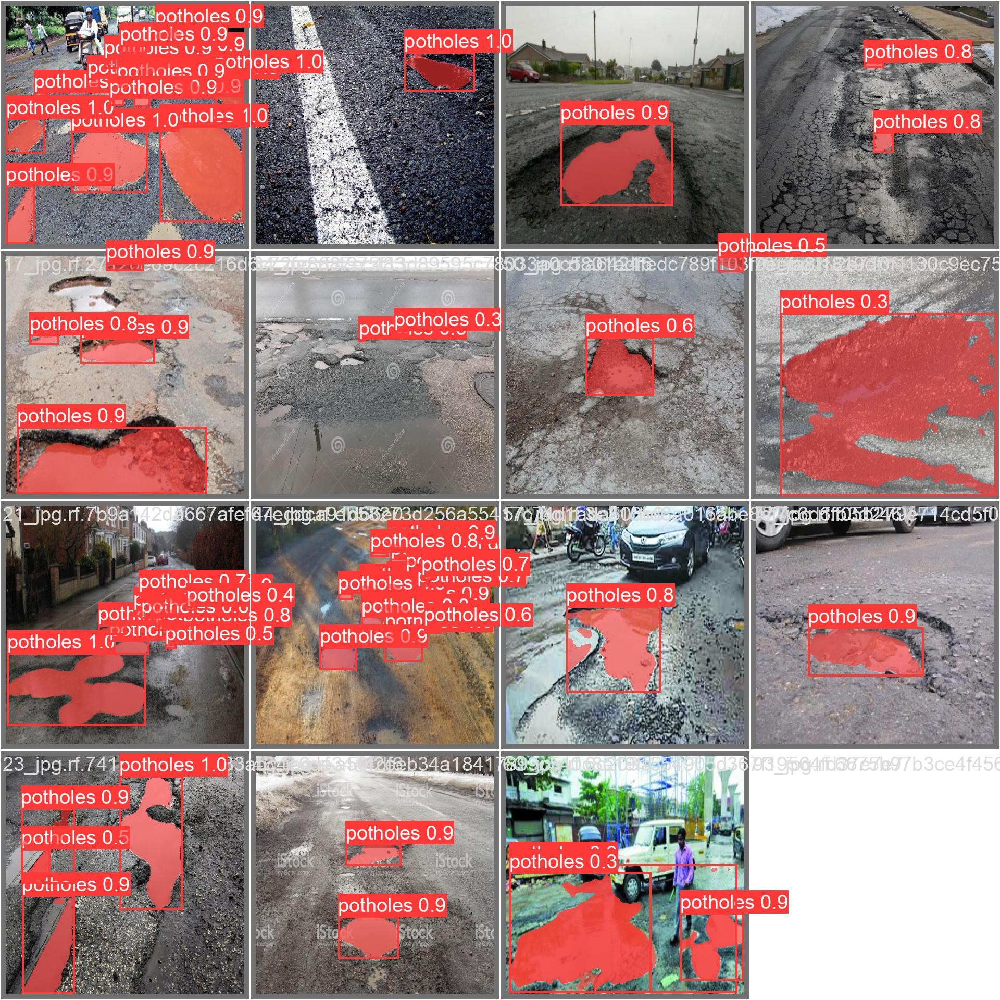

In [13]:
Image("/content/ultralytics/runs/segment/train2/val_batch0_pred.jpg")

#**Display the Confusion Matrix**

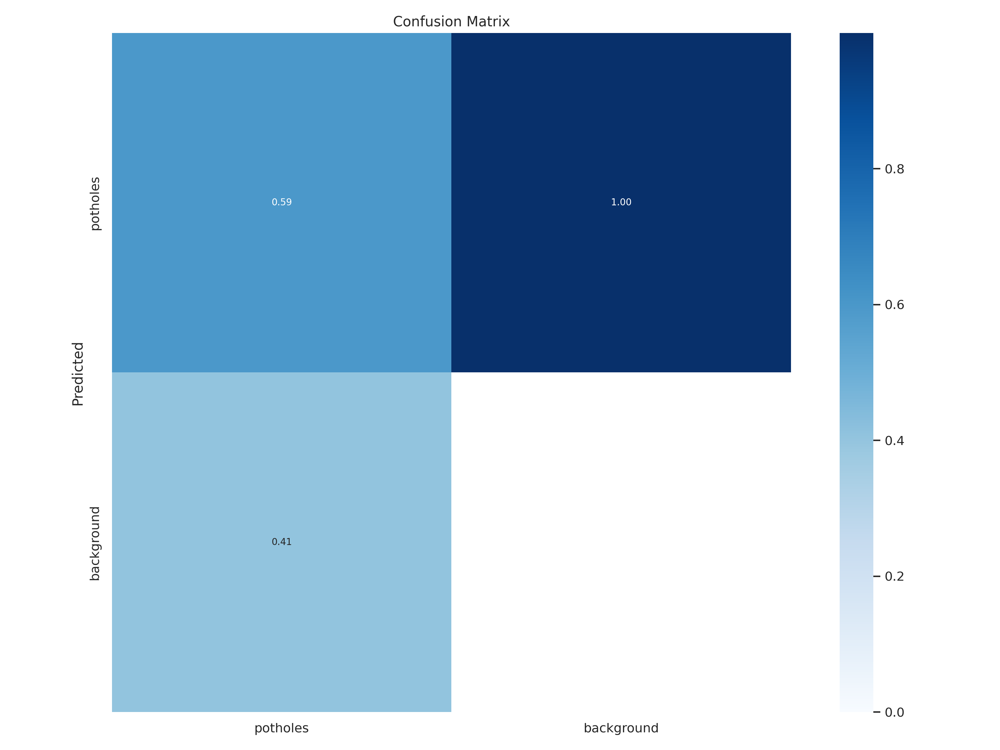

In [16]:
Image("//content/ultralytics/runs/segment/train2/confusion_matrix.png")

#**Train and Validation Losses**

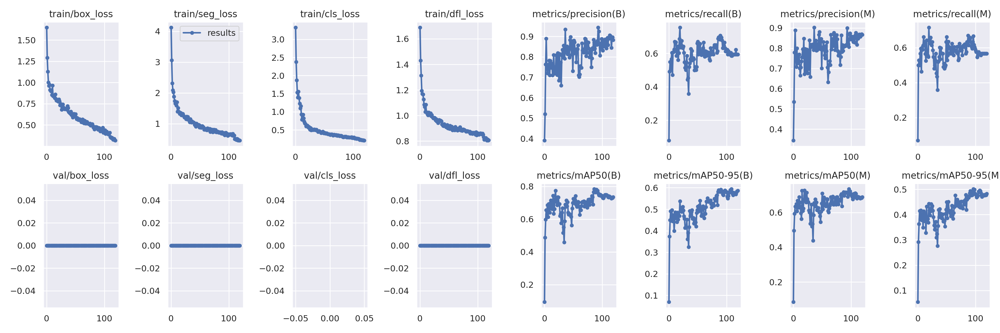

In [17]:
Image("/content/ultralytics/runs/segment/train2/results.png")

#**Downloading the Demo Video**

In [ ]:
!gdown "https://drive.google.com/uc?id=1iMitK9VCUWmBcZiiEPHK1d2pydALof6s&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1iMitK9VCUWmBcZiiEPHK1d2pydALof6s&confirm=t
To: /content/ultralytics/ultralytics/yolo/v8/segment/demo.mp4
100% 4.39M/4.39M [00:00<00:00, 239MB/s]


#**Downloading the Weights File From the Drive**

In [ ]:
!gdown "https://drive.google.com/uc?id=1V2k7WF3hgx7wKMwO3G-DVOCGeI73xlGf&confirm=t"


Downloading...
From: https://drive.google.com/uc?id=1V2k7WF3hgx7wKMwO3G-DVOCGeI73xlGf&confirm=t
To: /content/best.pt
100% 92.3M/92.3M [00:01<00:00, 49.4MB/s]


#**Testing the Model**

In [18]:
!python predict.py model='/content/ultralytics/runs/segment/train/weights/best.pt' source='demo.mp4'

2025-02-28 05:57:35.193640: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740722255.214546   37837 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740722255.220774   37837 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-28 05:57:35.243392: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Ultralytics YOLOv8.0.3 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
/content/ultralytics/ultralytics/nn/tas

#**Display the Demo Video**

In [21]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/runs/detect/train4/demo.mp4'

# Compressed video path
compressed_path = "/content/ultralytics/runs/detect/train2/demo.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [22]:
!zip -r /content/ultralytics.zip /content/ultralytics

  adding: content/ultralytics/ (stored 0%)
  adding: content/ultralytics/mkdocs.yml (deflated 61%)
  adding: content/ultralytics/.gitignore (deflated 49%)
  adding: content/ultralytics/.pre-commit-config.yaml (deflated 58%)
  adding: content/ultralytics/setup.py (deflated 56%)
  adding: content/ultralytics/MANIFEST.in (deflated 23%)
  adding: content/ultralytics/README.md (deflated 80%)
  adding: content/ultralytics/tests/ (stored 0%)
  adding: content/ultralytics/tests/test_cli.py (deflated 75%)
  adding: content/ultralytics/tests/test_python.py (deflated 69%)
  adding: content/ultralytics/tests/test_engine.py (deflated 74%)
  adding: content/ultralytics/.git/ (stored 0%)
  adding: content/ultralytics/.git/packed-refs (deflated 11%)
  adding: content/ultralytics/.git/HEAD (stored 0%)
  adding: content/ultralytics/.git/config (deflated 33%)
  adding: content/ultralytics/.git/refs/ (stored 0%)
  adding: content/ultralytics/.git/refs/remotes/ (stored 0%)
  adding: content/ultralytics/.gi

In [23]:
from google.colab import files
files.download('/content/ultralytics.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>